# Indonesia Covid-19 Data Analytics & Explorations
Data from @kawalcovid19

https://docs.google.com/spreadsheets/d/1ma1T9hWbec1pXlwZ89WakRk-OfVUQZsOCFl4FwZxzVw/edit#gid=2052139453

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from datetime import datetime



## Load Data

In [2]:
format = 'csv' # export format
sheet_gid = '2052139453' # get from browser url when sheet clicked
data_url = 'https://docs.google.com/spreadsheets/d/1ma1T9hWbec1pXlwZ89WakRk-OfVUQZsOCFl4FwZxzVw/export?format={}&gid={}'.format(format,sheet_gid)
df_RAW = pd.read_csv(data_url,thousands=',')
df_RAW.head()

,Total Kasus,Aceh,Bali,Banten,Babel,Bengkulu,DIY,Jakarta,Jambi,Jabar,...,Riau,Malut,Maluku,Papbar,Papua,Sulbar,NTT,Gorontalo,?,Unnamed: 36
0,18-Mar,0,1,17,0,0,3,158,0,24,...,1,0,0,0,0,0,0,0,0,NaN
1,19-Mar,0,1,27,0,0,5,210,0,26,...,2,0,0,0,0,0,0,0,0,NaN
2,20-Mar,0,4,37,0,0,4,215,0,41,...,1,0,0,0,0,0,0,0,13,NaN
3,21-Mar,0,3,43,0,0,5,267,0,55,...,1,0,0,0,0,0,0,0,10,NaN
4,22-Mar,0,3,47,0,0,5,307,0,59,...,1,0,1,0,2,0,0,0,6,NaN


In [3]:
df_RAW.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2584 entries, 0 to 2583
Data columns (total 37 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Total Kasus  2567 non-null   object 
 1   Aceh         2035 non-null   object 
 2   Bali         2378 non-null   object 
 3   Banten       2344 non-null   object 
 4   Babel        1994 non-null   object 
 5   Bengkulu     2032 non-null   object 
 6   DIY          2106 non-null   object 
 7   Jakarta      2296 non-null   object 
 8   Jambi        1656 non-null   object 
 9   Jabar        2213 non-null   object 
 10  Jateng       2196 non-null   object 
 11  Jatim        2302 non-null   object 
 12  Kalbar       1771 non-null   object 
 13  Kaltim       2121 non-null   object 
 14  Kalteng      1976 non-null   object 
 15  Kalsel       2119 non-null   object 
 16  Kaltara      1815 non-null   object 
 17  Kep Riau     1897 non-null   object 
 18  NTB          2055 non-null   object 
 19  Sumsel

## Preprocessing

RAW Data is Timeline sheet on the spreadsheet that update everyday. It has 37 columns, first column contains time on D M or D-M format on string,
so we need to parse it to datetime format.
First column also contains categories that we care from first row is total cases then 'Kasus Harian', 'Kasus Aktif', 'Sembuh', 'Sembuh Harian', 'Meninggal Dunia', 'Meninggal Dunia Harian' so we need to split it dynamically to several dataframes.
Also we dont need 2 last column as it nothing.

In [4]:
categories = ['Kasus Harian', 'Kasus Aktif', 'Sembuh', 'Sembuh Harian', 'Meninggal Dunia', 'Meninggal Dunia Harian']
df_clean = df_RAW.iloc[:, :-2] # remove 2 last columns

# We dont care about meninggal Luar Jakarta categories and others remaining, so we find its index
index_no_need = df_clean[df_clean['Bali'].str.match('Luar Jakarta', na=False)].index.values[0]
df_clean = df_clean.iloc[:index_no_need,:]

# take rows that total kasus is not NaN
df_clean = df_clean[df_clean['Total Kasus'].notna()]

# reset index after filter some rows
df_clean.reset_index(drop=True, inplace=True)

# find indexes of categories key
index_categories = {}
for category in categories:
    # find index of each category on 'Total Kasus' column, na = False (not remove NA values).
    index_categories[category] = df_clean[df_clean['Total Kasus'].str.match(category, na=False)].index.values[0]

# get total kasus from 0 to kasus harian, and remove rows that has all values as NaN.
df_total_cases = df_clean.iloc[:index_categories['Kasus Harian'], :]

# as categories is in the list, better use loop
df_categories = {}
idx_categories_list = list(index_categories.values()) # convert values to list
for i in range(len(idx_categories_list)):
    if i < len(idx_categories_list) - 1:
        # filter rows based on range
        df_categories[categories[i]] = df_clean.iloc[idx_categories_list[i]+1:idx_categories_list[i+1], :]
    else:
        # as it last, last rows is index_no_need
        df_categories[categories[i]] = df_clean.iloc[idx_categories_list[i]+1:index_no_need, :]

# added df_total_kasus to df_categories
df_categories['Total Case'] = df_total_cases

# function for parsing time
def parse_time( df_category :pd.DataFrame)->list:
    time_list = []
    start_year = 2020
    for index, row in df_category.iterrows():
        #print(row['Time'])
        time_str = row['Time']

        # check new year, if 31-Dec than add year
        if '1 Jan' == time_str or '1-Jan' == time_str:
            start_year += 1

        # concate
        time_str = time_str + ' ' + str(start_year)

        # check format

        if '-' in time_str:
            time_dt = datetime.strptime(time_str,'%d-%b %Y')
            time_list.append(time_dt)
        else:
            time_dt = datetime.strptime(time_str,'%d %b %Y')
            time_list.append(time_dt)

        #print(time_dt)
    
    return time_list

# process next preprocessing for each category
for category, df_category in df_categories.items():
    print("Preprocessing")
    print("Category : {}".format(category))
    # fill NaN to zero string
    df_category = df_category.fillna('0')

    # rename Total Kasus to time
    df_category = df_category.rename(columns={"Total Kasus" : "Time"})

    # parse time from string to datetime format pandas with year
    parse_time_list = parse_time(df_category)
    df_category.loc[:,'Time'] = parse_time_list
    
    # set time as index
    df_category = df_category.set_index('Time')

    # remove comma
    df_category = df_category.apply(lambda x : x.str.replace(',',''))
    
    # convert columns to numeric
    df_category = df_category.apply(pd.to_numeric)

    # set ddf_category
    df_categories[category] = df_category

    #df_categories[category] = df_category
    print(df_categories[category].info())

Preprocessing
Category : Kasus Harian
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 337 entries, 2020-03-15 to 2021-02-14
Data columns (total 34 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Aceh       337 non-null    int64
 1   Bali       337 non-null    int64
 2   Banten     337 non-null    int64
 3   Babel      337 non-null    int64
 4   Bengkulu   337 non-null    int64
 5   DIY        337 non-null    int64
 6   Jakarta    337 non-null    int64
 7   Jambi      337 non-null    int64
 8   Jabar      337 non-null    int64
 9   Jateng     337 non-null    int64
 10  Jatim      337 non-null    int64
 11  Kalbar     337 non-null    int64
 12  Kaltim     337 non-null    int64
 13  Kalteng    337 non-null    int64
 14  Kalsel     337 non-null    int64
 15  Kaltara    337 non-null    int64
 16  Kep Riau   337 non-null    int64
 17  NTB        337 non-null    int64
 18  Sumsel     337 non-null    int64
 19  Sumbar     337 non-null    int64
 2

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 334 entries, 2020-03-18 to 2021-02-14
Data columns (total 34 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Aceh       334 non-null    int64
 1   Bali       334 non-null    int64
 2   Banten     334 non-null    int64
 3   Babel      334 non-null    int64
 4   Bengkulu   334 non-null    int64
 5   DIY        334 non-null    int64
 6   Jakarta    334 non-null    int64
 7   Jambi      334 non-null    int64
 8   Jabar      334 non-null    int64
 9   Jateng     334 non-null    int64
 10  Jatim      334 non-null    int64
 11  Kalbar     334 non-null    int64
 12  Kaltim     334 non-null    int64
 13  Kalteng    334 non-null    int64
 14  Kalsel     334 non-null    int64
 15  Kaltara    334 non-null    int64
 16  Kep Riau   334 non-null    int64
 17  NTB        334 non-null    int64
 18  Sumsel     334 non-null    int64
 19  Sumbar     334 non-null    int64
 20  Sulut      334 non-null    int64
 2

In [5]:
df_categories['Kasus Harian'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 337 entries, 2020-03-15 to 2021-02-14
Data columns (total 34 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Aceh       337 non-null    int64
 1   Bali       337 non-null    int64
 2   Banten     337 non-null    int64
 3   Babel      337 non-null    int64
 4   Bengkulu   337 non-null    int64
 5   DIY        337 non-null    int64
 6   Jakarta    337 non-null    int64
 7   Jambi      337 non-null    int64
 8   Jabar      337 non-null    int64
 9   Jateng     337 non-null    int64
 10  Jatim      337 non-null    int64
 11  Kalbar     337 non-null    int64
 12  Kaltim     337 non-null    int64
 13  Kalteng    337 non-null    int64
 14  Kalsel     337 non-null    int64
 15  Kaltara    337 non-null    int64
 16  Kep Riau   337 non-null    int64
 17  NTB        337 non-null    int64
 18  Sumsel     337 non-null    int64
 19  Sumbar     337 non-null    int64
 20  Sulut      337 non-null    int64
 2

In [6]:
df_categories['Total Case'].tail()

,Aceh,Bali,Banten,Babel,Bengkulu,DIY,Jakarta,Jambi,Jabar,Jateng,...,Sulteng,Lampung,Riau,Malut,Maluku,Papbar,Papua,Sulbar,NTT,Gorontalo
Time,,,,,,,,,,,,,,,,,,,,,
2021-02-10,9373,29295,26770,5549,4666,24273,303715,4928,170642,138546,...,9059,11151,29842,3713,6630,6918,15939,4701,6568,4527
2021-02-11,9390,29666,26810,5709,4677,24534,306229,4961,171701,139532,...,9097,11217,29931,3762,6640,6934,15980,4728,6600,4541
2021-02-12,9398,29978,26957,5823,4694,24812,310039,4991,172384,140196,...,9132,11293,30027,3820,6640,6969,16046,4767,6785,4570
2021-02-13,9399,30134,27071,5956,4703,24925,313057,5024,174121,140959,...,9209,11368,30074,3847,6714,6977,16101,4862,7020,4574
2021-02-14,9403,30273,27145,6086,4721,25033,315553,5058,175003,141437,...,9266,11457,30141,3869,6747,7001,16116,4869,7272,4593


# Visualize the data
## Table

In [7]:
df_categories['Total Case']

,Aceh,Bali,Banten,Babel,Bengkulu,DIY,Jakarta,Jambi,Jabar,Jateng,...,Sulteng,Lampung,Riau,Malut,Maluku,Papbar,Papua,Sulbar,NTT,Gorontalo
Time,,,,,,,,,,,,,,,,,,,,,
2020-03-18,0,1,17,0,0,3,158,0,24,8,...,0,1,1,0,0,0,0,0,0,0
2020-03-19,0,1,27,0,0,5,210,0,26,12,...,0,1,2,0,0,0,0,0,0,0
2020-03-20,0,4,37,0,0,4,215,0,41,12,...,0,1,1,0,0,0,0,0,0,0
2020-03-21,0,3,43,0,0,5,267,0,55,14,...,0,1,1,0,0,0,0,0,0,0
2020-03-22,0,3,47,0,0,5,307,0,59,15,...,0,1,1,0,1,0,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-10,9373,29295,26770,5549,4666,24273,303715,4928,170642,138546,...,9059,11151,29842,3713,6630,6918,15939,4701,6568,4527
2021-02-11,9390,29666,26810,5709,4677,24534,306229,4961,171701,139532,...,9097,11217,29931,3762,6640,6934,15980,4728,6600,4541
2021-02-12,9398,29978,26957,5823,4694,24812,310039,4991,172384,140196,...,9132,11293,30027,3820,6640,6969,16046,4767,6785,4570


In [8]:
df_categories['Kasus Aktif']

,Aceh,Bali,Banten,Babel,Bengkulu,DIY,Jakarta,Jambi,Jabar,Jateng,...,Sulteng,Lampung,Riau,Malut,Maluku,Papbar,Papua,Sulbar,NTT,Gorontalo
Time,,,,,,,,,,,,,,,,,,,,,
2020-03-21,0,2,40,0,0,4,227,0,47,11,...,0,1,1,0,0,0,0,0,0,0
2020-03-22,0,1,43,0,0,4,256,0,45,12,...,0,1,1,0,1,0,2,0,0,0
2020-03-23,0,4,52,0,0,4,301,1,45,12,...,0,1,1,1,1,0,2,0,0,0
2020-03-24,0,4,60,0,0,4,370,1,45,16,...,0,1,2,1,1,0,3,0,0,0
2020-03-25,0,7,62,0,0,14,409,1,58,34,...,0,1,1,1,1,0,3,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-10,1239,3053,6587,747,119,6086,24266,1102,27903,43398,...,2520,2003,1014,586,775,512,6961,2035,2928,315
2021-02-11,1251,2990,6553,806,110,6088,22725,1106,27807,43620,...,2469,1933,1055,618,772,511,6986,2001,2817,267
2021-02-12,1259,2977,6687,768,112,6184,20849,1113,26903,44110,...,2466,1855,1056,667,772,523,7033,1994,2936,286


In [9]:
df_categories['Kasus Harian']

,Aceh,Bali,Banten,Babel,Bengkulu,DIY,Jakarta,Jambi,Jabar,Jateng,...,Sulteng,Lampung,Riau,Malut,Maluku,Papbar,Papua,Sulbar,NTT,Gorontalo
Time,,,,,,,,,,,,,,,,,,,,,
2020-03-15,0,0,0,0,0,0,19,0,0,2,...,0,0,0,0,0,0,0,0,0,0
2020-03-16,0,0,1,0,0,0,14,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2020-03-17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-18,0,0,4,0,0,1,30,0,12,2,...,0,1,1,0,0,0,0,0,0,0
2020-03-19,0,0,10,0,0,2,52,0,2,4,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-10,3,305,30,89,7,291,3309,45,660,1220,...,63,106,173,40,30,23,101,23,90,26
2021-02-11,17,371,40,160,11,261,2514,33,1059,986,...,38,66,89,49,10,16,41,27,32,14
2021-02-12,8,312,147,114,17,278,3810,30,683,664,...,35,76,96,58,0,35,66,39,185,29


In [10]:
df_categories['Sembuh']

,Aceh,Bali,Banten,Babel,Bengkulu,DIY,Jakarta,Jambi,Jabar,Jateng,...,Sulteng,Lampung,Riau,Malut,Maluku,Papbar,Papua,Sulbar,NTT,Gorontalo
Time,,,,,,,,,,,,,,,,,,,,,
2020-03-21,0,0,1,0,0,1,17,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-22,0,0,1,0,0,1,22,0,5,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-23,0,0,1,0,0,1,23,0,5,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-24,0,0,1,0,0,1,23,0,5,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-25,0,0,1,0,0,1,23,0,5,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-10,7754,25479,19582,4710,4402,17623,274740,3750,140655,89435,...,6324,8569,28114,3018,5754,6295,8808,2579,3464,4090
2021-02-11,7759,25901,19656,4808,4422,17879,278744,3779,141792,90186,...,6407,8699,28159,3034,5767,6311,8824,2639,3602,4152
2021-02-12,7759,26218,19669,4959,4437,18053,284380,3801,143374,90339,...,6444,8844,28251,3043,5767,6334,8842,2684,3662,4161


In [11]:
df_categories['Sembuh Harian']

,Aceh,Bali,Banten,Babel,Bengkulu,DIY,Jakarta,Jambi,Jabar,Jateng,...,Sulteng,Lampung,Riau,Malut,Maluku,Papbar,Papua,Sulbar,NTT,Gorontalo
Time,,,,,,,,,,,,,,,,,,,,,
2020-03-21,0,0,0,0,0,1,3,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-22,0,0,0,0,0,0,5,0,4,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-23,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-24,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-10,21,317,254,95,15,253,3245,21,1059,1316,...,231,180,129,13,36,25,10,34,27,21
2021-02-11,5,422,74,98,20,256,4004,29,1127,751,...,83,130,45,16,13,16,16,60,138,62
2021-02-12,0,317,13,151,15,174,5636,22,1582,153,...,37,145,92,9,0,23,18,45,60,9


## Plot

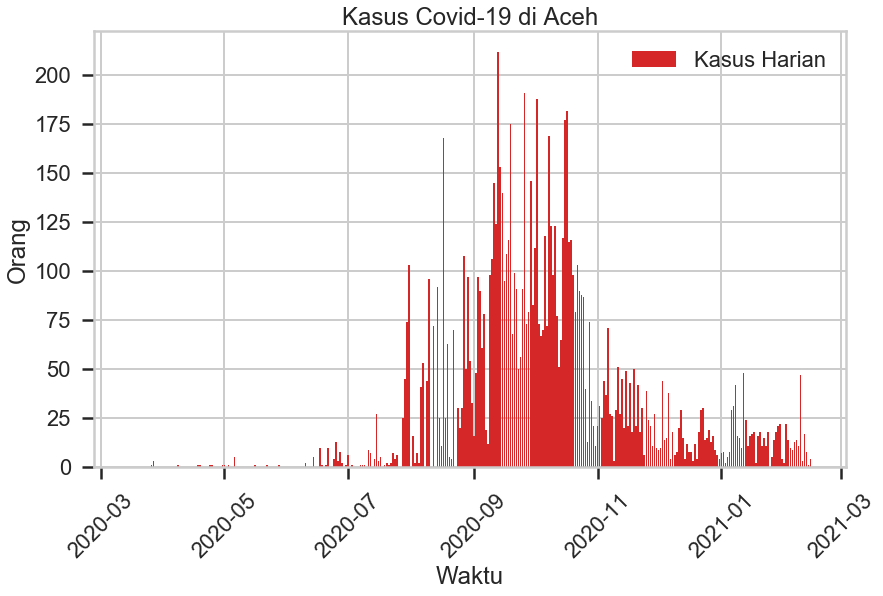

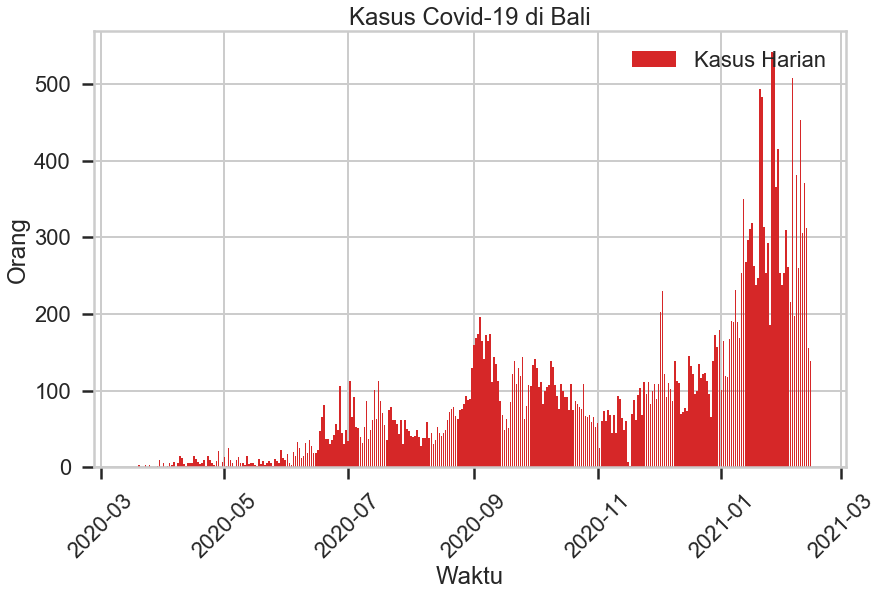

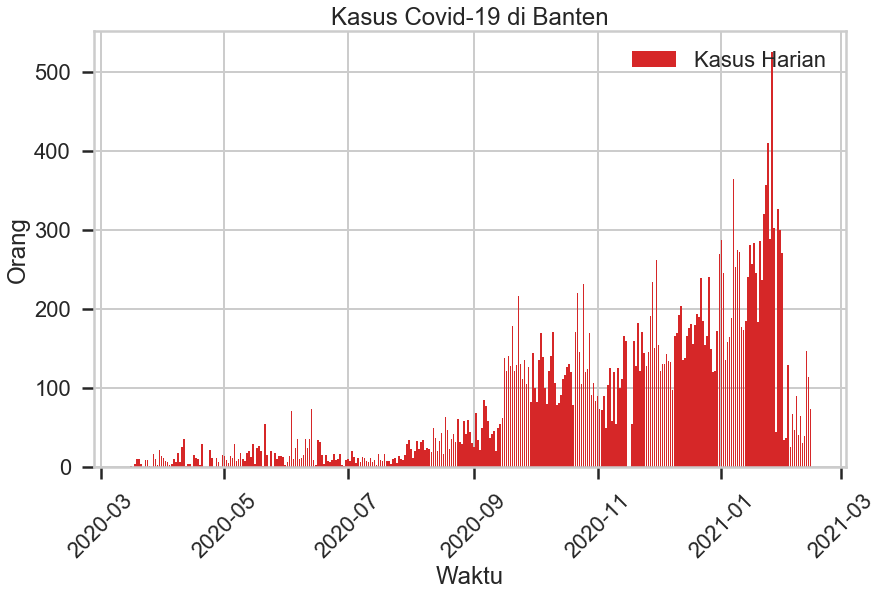

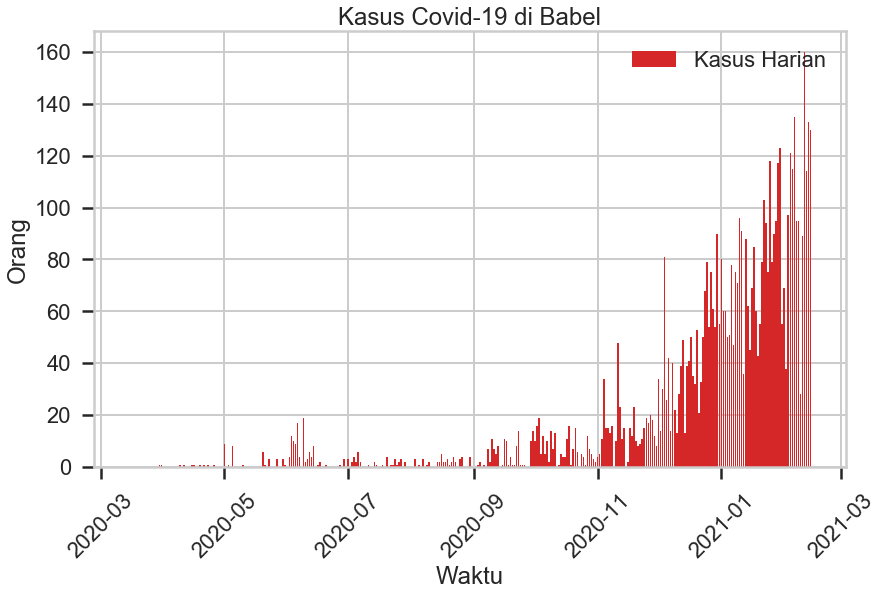

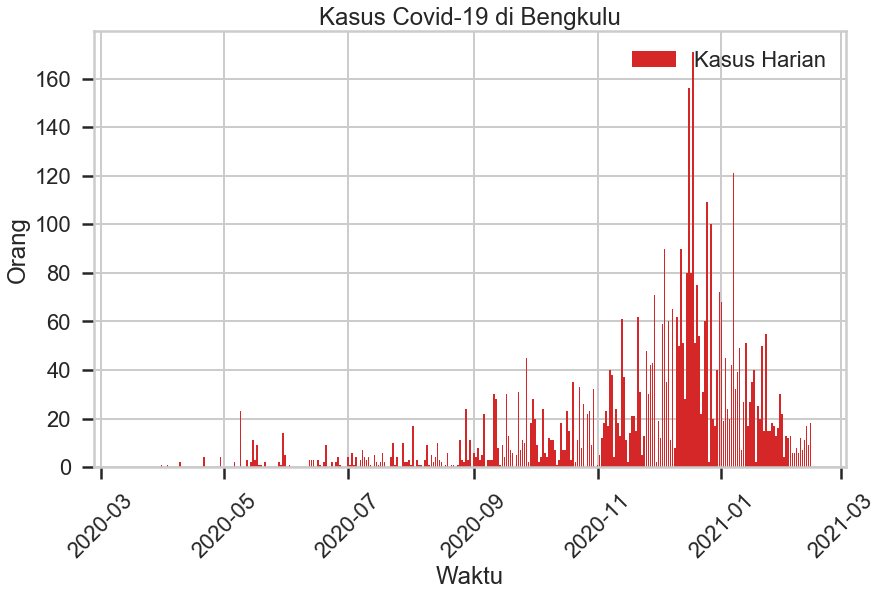

...

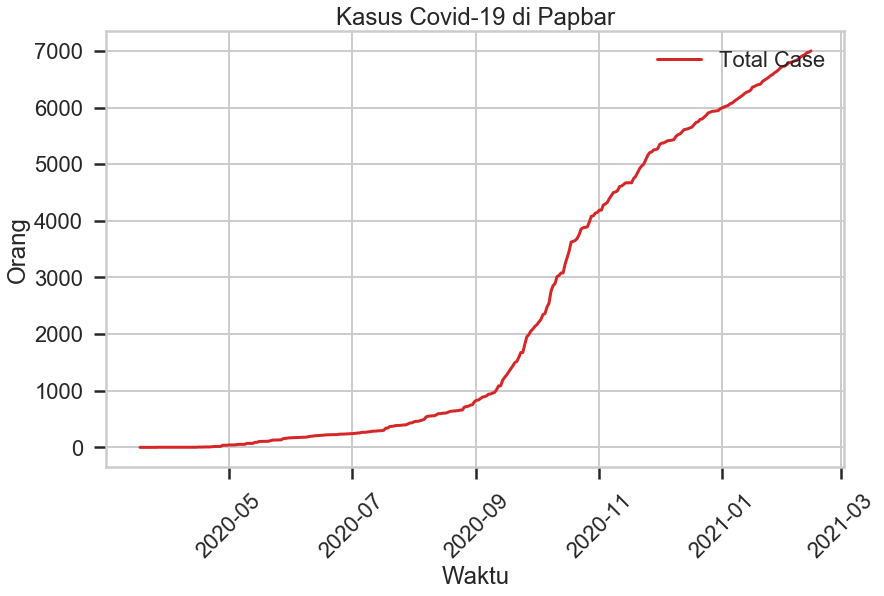

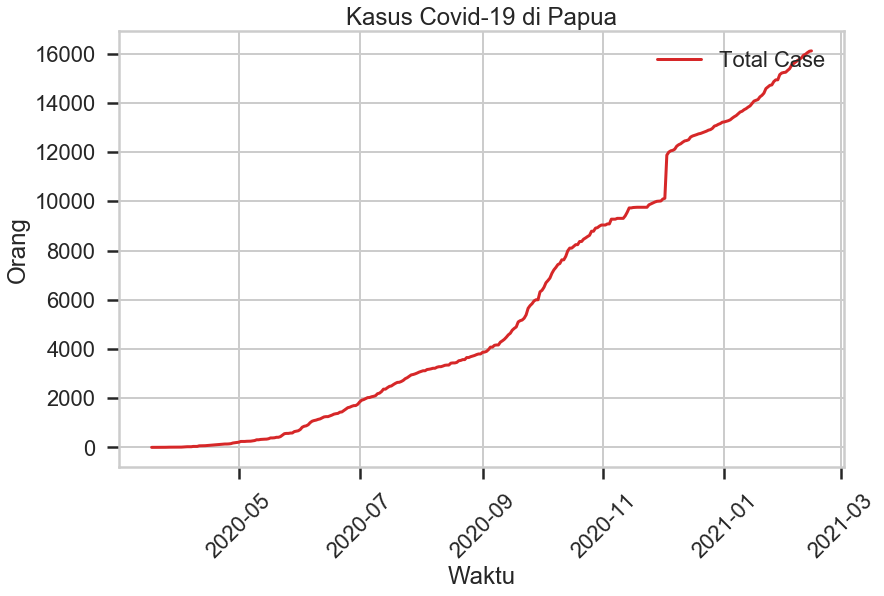

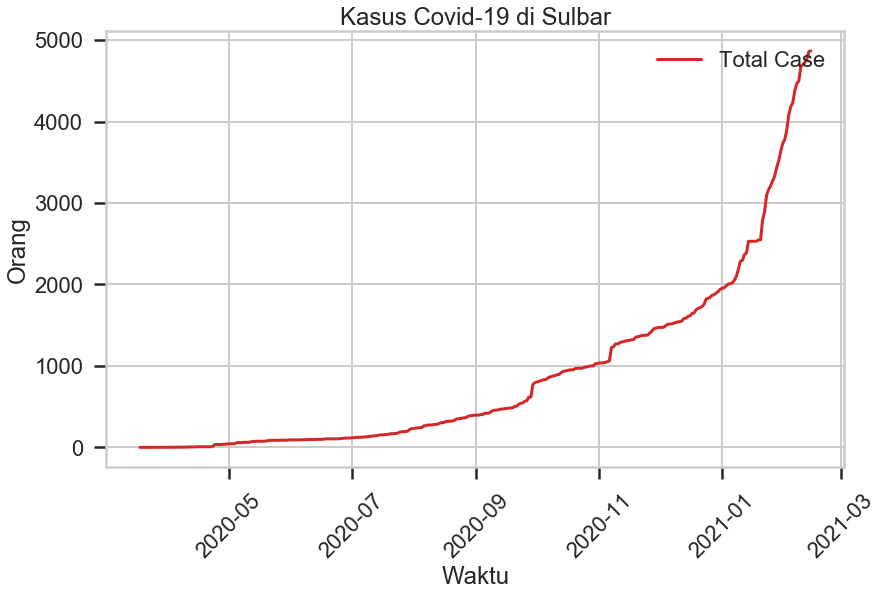

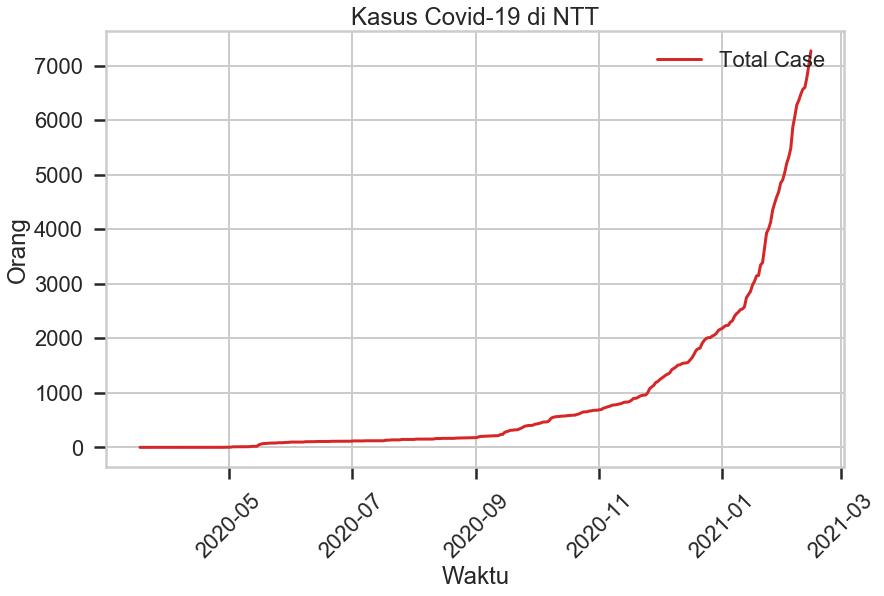

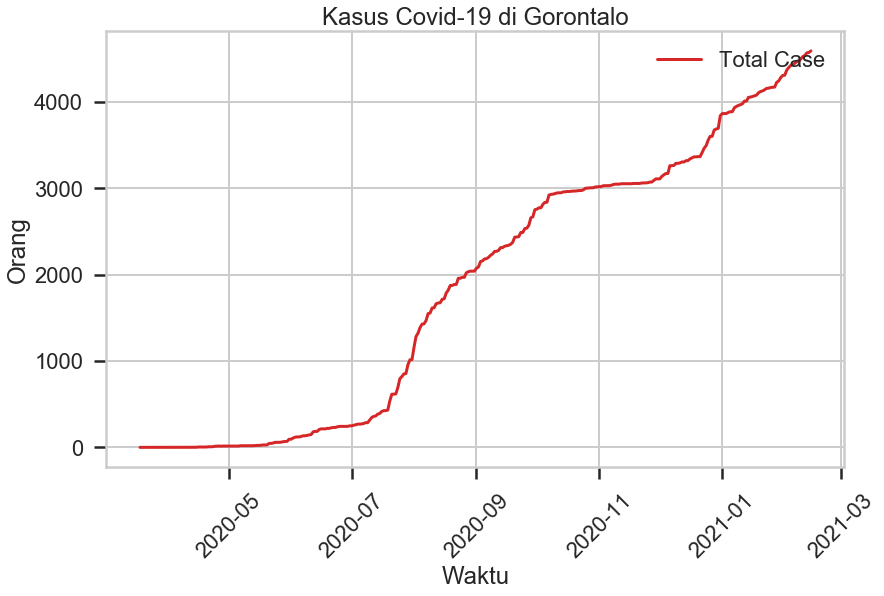

In [15]:
#sns.set_style("whitegrid")
import matplotlib.style as style

%matplotlib inline
style.use('seaborn-poster') #sets the size of the charts
style.use('seaborn-whitegrid')
sns.set_context('poster')


for category, df_category in df_categories.items():
    for province in df_category.columns:
        fig, ax = plt.subplots()
        
        if 'Harian' in category:
            #ax.bar(df_category.index,df_category[province], label=category)
            #sns.barplot( x = df_category.index, y= province, data = df_category)
            ax.bar(df_category.index,df_category[province], color='tab:red', label=category)
        else:
            ax.plot(df_category.index,df_category[province], color='tab:red', label=category)
            
        ax.set_title('Kasus Covid-19 di {}'.format(province))
        ax.set_xlabel('Waktu')
        ax.set_ylabel('Orang')
        ax.legend(loc='upper right')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig('images/{}_{}.png'.format(category, province), dpi=300)
        plt.show()
        
        #break
      

In [13]:
# test seaborn